In [1]:
import pyrealsense2 as rs
pipe = rs.pipeline()
profile = pipe.start()
try:
  for i in range(0, 100):
    frames = pipe.wait_for_frames()
    for f in frames:
      print(f.profile)
finally:
    pipe.stop()

<pyrealsense2.[video_]stream_profile: Depth(0) 848x480 @ 30fps Z16>
<pyrealsense2.[video_]stream_profile: Color(0) 640x480 @ 30fps RGB8>
<pyrealsense2.[video_]stream_profile: Depth(0) 848x480 @ 30fps Z16>
<pyrealsense2.[video_]stream_profile: Color(0) 640x480 @ 30fps RGB8>
<pyrealsense2.[video_]stream_profile: Depth(0) 848x480 @ 30fps Z16>
<pyrealsense2.[video_]stream_profile: Color(0) 640x480 @ 30fps RGB8>
<pyrealsense2.[video_]stream_profile: Depth(0) 848x480 @ 30fps Z16>
<pyrealsense2.[video_]stream_profile: Color(0) 640x480 @ 30fps RGB8>
<pyrealsense2.[video_]stream_profile: Depth(0) 848x480 @ 30fps Z16>
<pyrealsense2.[video_]stream_profile: Color(0) 640x480 @ 30fps RGB8>
<pyrealsense2.[video_]stream_profile: Depth(0) 848x480 @ 30fps Z16>
<pyrealsense2.[video_]stream_profile: Color(0) 640x480 @ 30fps RGB8>
<pyrealsense2.[video_]stream_profile: Depth(0) 848x480 @ 30fps Z16>
<pyrealsense2.[video_]stream_profile: Color(0) 640x480 @ 30fps RGB8>
<pyrealsense2.[video_]stream_profile: Dep

In [2]:
import pyrealsense2 as rs

# Initialize the pipeline
pipe = rs.pipeline()
profile = pipe.start()

try:
    # Loop to capture 100 frames
    for i in range(100):
        # Wait for the next set of frames
        frames = pipe.wait_for_frames()
        
        # Iterate through each frame in the frameset
        for f in frames:
            # Access the frame profile to get stream details
            stream_type = f.profile.stream_type()
            format_type = f.profile.format()
            width = f.profile.as_video_stream_profile().width()
            height = f.profile.as_video_stream_profile().height()
            
            # Print details about the frame
            print(f"Frame {i}: Stream Type: {stream_type}, Format: {format_type}, Resolution: {width}x{height}")

finally:
    # Stop the pipeline
    pipe.stop()


Frame 0: Stream Type: stream.depth, Format: format.z16, Resolution: 848x480
Frame 0: Stream Type: stream.color, Format: format.rgb8, Resolution: 640x480
Frame 1: Stream Type: stream.depth, Format: format.z16, Resolution: 848x480
Frame 1: Stream Type: stream.color, Format: format.rgb8, Resolution: 640x480
Frame 2: Stream Type: stream.depth, Format: format.z16, Resolution: 848x480
Frame 2: Stream Type: stream.color, Format: format.rgb8, Resolution: 640x480
Frame 3: Stream Type: stream.depth, Format: format.z16, Resolution: 848x480
Frame 3: Stream Type: stream.color, Format: format.rgb8, Resolution: 640x480
Frame 4: Stream Type: stream.depth, Format: format.z16, Resolution: 848x480
Frame 4: Stream Type: stream.color, Format: format.rgb8, Resolution: 640x480
Frame 5: Stream Type: stream.depth, Format: format.z16, Resolution: 848x480
Frame 5: Stream Type: stream.color, Format: format.rgb8, Resolution: 640x480
Frame 6: Stream Type: stream.depth, Format: format.z16, Resolution: 848x480
Frame 

In [3]:
import pyrealsense2 as rs
import numpy as np
import cv2  # OpenCV for image display

# Initialize the pipeline
pipe = rs.pipeline()
config = rs.config()
config.enable_stream(rs.stream.color, 640, 480, rs.format.bgr8, 30)  # Enable color stream only
profile = pipe.start(config)

try:
    # Loop to capture 100 frames
    for i in range(100):
        # Wait for the next set of frames
        frames = pipe.wait_for_frames()

        # Get color frame
        color_frame = frames.get_color_frame()

        # Ensure the frame is valid
        if not color_frame:
            continue

        # Convert frame to numpy array
        color_image = np.asanyarray(color_frame.get_data())  # Convert to RGB image

        # Display the image
        cv2.imshow("RealSense Color Frame", color_image)

        # Exit on 'q' key press
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

finally:
    # Stop the pipeline and close OpenCV windows
    pipe.stop()
    cv2.destroyAllWindows()


First 100 characters of base64_image:
/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAx

Length of base64_image string: 1804

First 50 bytes of byte_value:
[255, 216, 255, 224, 0, 16, 74, 70, 73, 70, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 255, 219, 0, 67, 0, 8, 6, 6, 7, 6, 5, 8, 7, 7, 7, 9, 9, 8, 10, 12, 20, 13, 12, 11, 11, 12, 25, 18, 19, 15]

Total size of byte_value in bytes: 1353


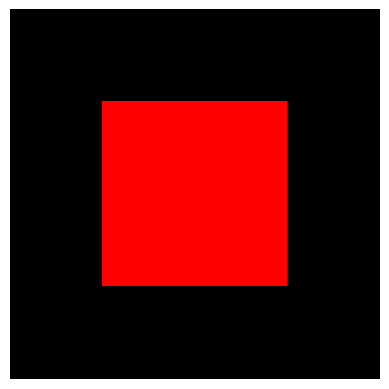

In [4]:
import numpy as np
import cv2
from PIL import Image
import io
import base64

# Create a simple test image (a red square)
test_image = np.zeros((100, 100, 3), dtype=np.uint8)
test_image[25:75, 25:75] = [0, 0, 255]  # Red square in BGR format

# Convert BGR to RGB
test_image_rgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

# Use your prepare_image_for_api function
def prepare_image_for_api(image):
    pil_image = Image.fromarray(image)
    byte_stream = io.BytesIO()
    pil_image.save(byte_stream, format='JPEG')
    img_bytes = byte_stream.getvalue()
    base64_image = base64.b64encode(img_bytes).decode('utf-8')
    return base64_image, byte_stream.getvalue()

# Get the values
base64_image, byte_value = prepare_image_for_api(test_image_rgb)

# Display the results
print("First 100 characters of base64_image:")
print(base64_image[:100])
print("\nLength of base64_image string:", len(base64_image))

print("\nFirst 50 bytes of byte_value:")
print(list(byte_value[:50]))
print("\nTotal size of byte_value in bytes:", len(byte_value))

# Optional: Display the test image
import matplotlib.pyplot as plt
plt.imshow(test_image_rgb)
plt.axis('off')
plt.show()

In [5]:
import pyrealsense2 as rs
pipe = rs.pipeline()
profile = pipe.start()
try:
  for i in range(0, 1):
    frames = pipe.wait_for_frames()
    for f in frames:
      print(f)
finally:
    pipe.stop()

<pyrealsense2.frame Z16 #8 @1738307865569.241943>
<pyrealsense2.frame RGB8 #1 @1738307865657.343994>


Array Shape: (720, 1280, 3)

Data Type: uint8

First few pixels (BGR format):
[[[102 135 142]
  [101 134 141]
  [ 97 132 138]
  ...
  [117 137 112]
  [116 138 101]
  [115 136 100]]

 [[ 99 136 142]
  [100 138 143]
  [ 97 137 142]
  ...
  [115 139 115]
  [114 138 105]
  [112 135 102]]

 [[ 93 137 143]
  [ 91 136 142]
  [ 91 137 140]
  ...
  [114 138 116]
  [108 131 105]
  [109 132 106]]

 ...

 [[ 21  32  33]
  [ 22  34  34]
  [ 26  37  38]
  ...
  [ 62  83  83]
  [ 68  86  86]
  [ 70  88  89]]

 [[ 23  39  36]
  [ 24  40  37]
  [ 29  41  39]
  ...
  [ 55  80  80]
  [ 57  80  81]
  [ 63  86  87]]

 [[ 27  46  42]
  [ 28  47  43]
  [ 33  44  43]
  ...
  [ 56  81  81]
  [ 58  83  84]
  [ 59  84  85]]]


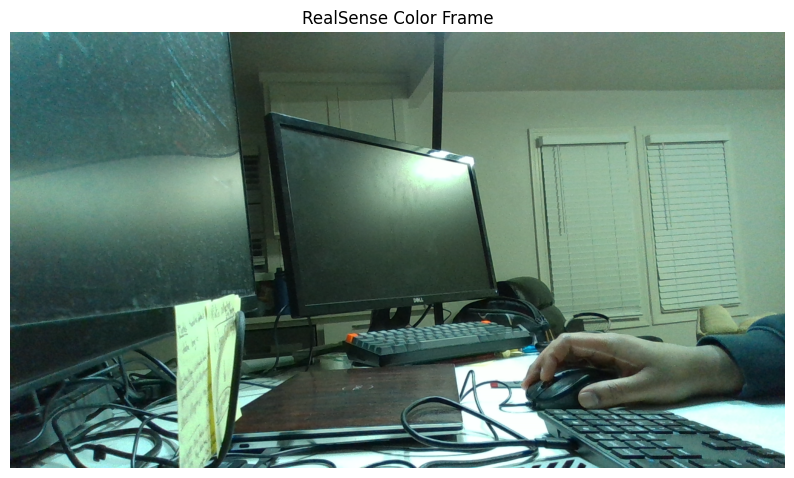

In [6]:
import pyrealsense2 as rs
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Initialize pipeline
pipe = rs.pipeline()
config = rs.config()
config.enable_stream(rs.stream.color, 1280, 720, rs.format.rgb8, 30)

profile = pipe.start(config)

try:
    # Skip first 5 frames to allow auto-exposure to stabilize
    for _ in range(20):
        pipe.wait_for_frames()
    
    # Get the next frame
    frames = pipe.wait_for_frames()
    color_frame = frames.get_color_frame()

    # Convert to numpy array
    color_image = np.asanyarray(color_frame.get_data())

    # Print array info
    print("Array Shape:", color_image.shape)
    print("\nData Type:", color_image.dtype)
    print("\nFirst few pixels (BGR format):")
    print(color_image)
    
finally:
    pipe.stop()

# Display the color image using matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(color_image)
plt.title('RealSense Color Frame')
plt.axis('off')
plt.show()

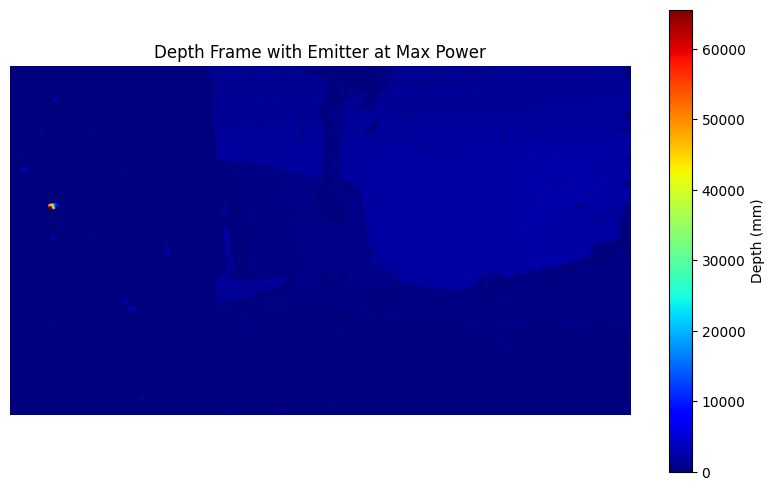

In [7]:
import pyrealsense2 as rs
import numpy as np

# Create pipeline
pipe = rs.pipeline()
config = rs.config()

# Get device and set settings before streaming
pipeline_wrapper = rs.pipeline_wrapper(pipe)
pipeline_profile = config.resolve(pipeline_wrapper)
device = pipeline_profile.get_device()
depth_sensor = device.first_depth_sensor()

# Enable emitter
if depth_sensor.supports(rs.option.emitter_enabled):
    depth_sensor.set_option(rs.option.emitter_enabled, 1)  # 1 to enable, 0 to disable

# Set laser power (usually 0-360)
if depth_sensor.supports(rs.option.laser_power):
    max_power = depth_sensor.get_option_range(rs.option.laser_power).max
    depth_sensor.set_option(rs.option.laser_power, max_power)

# Start streaming
config.enable_stream(rs.stream.depth, 1280, 720, rs.format.z16, 30)
pipe.start(config)

try:
    # Skip first few frames to allow auto-exposure
    for x in range(20):
        pipe.wait_for_frames()

    # Get frames
    frames = pipe.wait_for_frames()
    depth_frame = frames.get_depth_frame()
    depth_image = np.asanyarray(depth_frame.get_data())
    
    # Visualize
    plt.figure(figsize=(10, 6))
    plt.imshow(depth_image, cmap='jet')
    plt.colorbar(label='Depth (mm)')
    plt.title('Depth Frame with Emitter at Max Power')
    plt.axis('off')
    plt.show()
    
finally:
    pipe.stop()

In [8]:
import pyrealsense2 as rs
import numpy as np
import cv2
import base64
from openai import OpenAI
from PIL import Image
import io
from IPython.display import display, Image as IPImage, HTML


In [9]:
# Convert numpy array to PIL Image
pil_image = Image.fromarray(color_image)

# Create a byte stream 
byte_stream = io.BytesIO()

# Save the image to the byte stream in JPEG format 
pil_image.save(byte_stream, format='JPEG')

# Get the byte value and encode to base64
img_bytes = byte_stream.getvalue()
base64_image = base64.b64encode(img_bytes).decode('utf-8')

In [10]:
print(base64_image)

/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCALQBQADASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwCIPzmmNIW4xim78feI56UrOmMPn6106HjtX3GuQpwQQx6UM6j73aozkP8Ae4zTXPzc0xbExfAKqQGPQ01Nykn+I0i5HcDPNAJZzyM1L1GtTQs7z7PIGblc/MPb2rcLwzQqVkRlkHGD1zXKTKTEpYfMDnFS2d8kRAlBAJ6jNVDQ

In [11]:
depth_bytes = io.BytesIO()
np.save(depth_bytes, depth_image, allow_pickle=False)
depth_blob = depth_bytes.getvalue() # This is the Blob for database storage

In [12]:
print(depth_blob)

b'\x93NUMPY\x01\x00v\x00{\'descr\': \'<u2\', \'fortran_order\': False, \'shape\': (720, 1280), }                                                     \n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

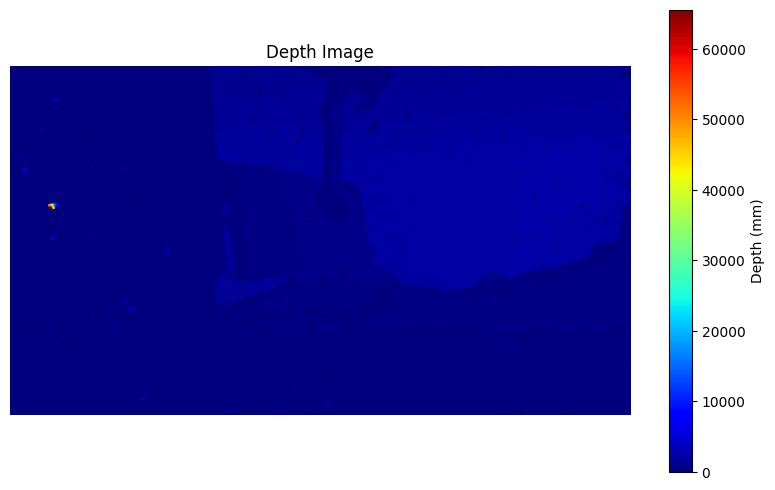

In [13]:
depth_image.shape

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.imshow(depth_image, cmap='jet')
plt.colorbar(label='Depth (mm)')
plt.title('Depth Image')
plt.axis('off')
plt.show()

In [14]:
depth_image.shape

(720, 1280)

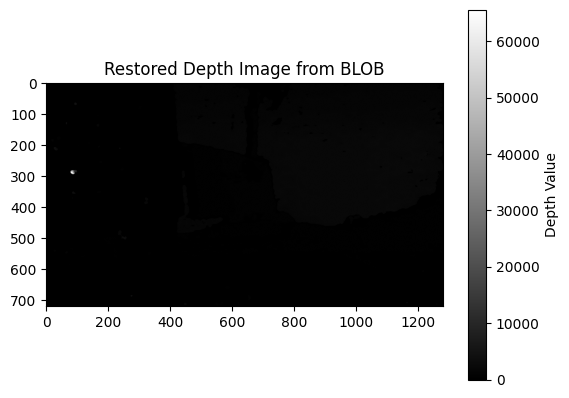

In [15]:
import numpy as np
import io
import matplotlib.pyplot as plt



# Convert BLOB back to NumPy array
depth_matrix_restored = np.load(io.BytesIO(depth_blob), allow_pickle=True)

# Display the restored depth image
plt.imshow(depth_matrix_restored, cmap='gray')
plt.colorbar(label="Depth Value")
plt.title("Restored Depth Image from BLOB")
plt.show()


In [16]:
import numpy as np

print(type(depth_image))  # Should be <class 'numpy.ndarray'>
print(depth_image.shape)  # Should be (720, 1280) or your depth image shape
print(depth_image.dtype)  # Should be np.uint16


<class 'numpy.ndarray'>
(720, 1280)
uint16


In [17]:
import io

depth_bytes = io.BytesIO()
np.save(depth_bytes, depth_image, allow_pickle=False)
depth_blob = depth_bytes.getvalue()

# Debugging output
print("Blob Type:", type(depth_blob))  # Should be <class 'bytes'>
print("Blob Size:", len(depth_blob))   # Should be greater than 0


Blob Type: <class 'bytes'>
Blob Size: 1843328


In [18]:
np.save("test_depth.npy", depth_image, allow_pickle=False)  # Save depth image
test_blob = open("test_depth.npy", "rb").read()  # Read as binary

print("Test Blob Size:", len(test_blob))  # Should NOT be 0


Test Blob Size: 1843328


In [19]:
depth_bytes = io.BytesIO()
np.save(depth_bytes, depth_image, allow_pickle=False)
depth_blob = depth_bytes.getvalue()

# Ensure the variable holds data
if not depth_blob:
    print("⚠️ Error: depth_blob is EMPTY!")
else:
    print("✅ Encoding Successful. Blob Size:", len(depth_blob))


✅ Encoding Successful. Blob Size: 1843328


In [20]:

from dataclasses import dataclass
import numpy as np
import io
import base64
from PIL import Image
import psycopg2

@dataclass
class Frame:
    """Data class to hold frame data"""
    color_image: np.ndarray
    depth_image: np.ndarray

    def encode_color_image(self) -> str:
        """Convert numpy color image to Base64 string"""
        pil_image = Image.fromarray(self.color_image)
        byte_stream = io.BytesIO()
        pil_image.save(byte_stream, format='JPEG')
        img_bytes = byte_stream.getvalue()
        return base64.b64encode(img_bytes).decode('utf-8')  # Convert to Base64

    def encode_depth_image(self) -> bytes:
        """Convert numpy depth image to BLOB (binary)"""
        depth_bytes = io.BytesIO()
        np.save(depth_bytes, self.depth_image, allow_pickle=False)
        return depth_bytes.getvalue()  # Get BLOB data

def insert_frame_to_db(frame: Frame, timestamp: int):
    """Insert a Frame into TimescaleDB"""
    conn = psycopg2.connect("dbname=mydb user=postgres password=mysecretpassword host=localhost port=5432")
    cursor = conn.cursor()

    color_image_base64 = frame.encode_color_image()
    depth_image_blob = frame.encode_depth_image()

    cursor.execute(
        "INSERT INTO frames (timestamp, color_image_base64, depth_image) VALUES (%s, %s, %s)",
        (timestamp, color_image_base64, psycopg2.Binary(depth_image_blob))
    )

    conn.commit()
    conn.close()

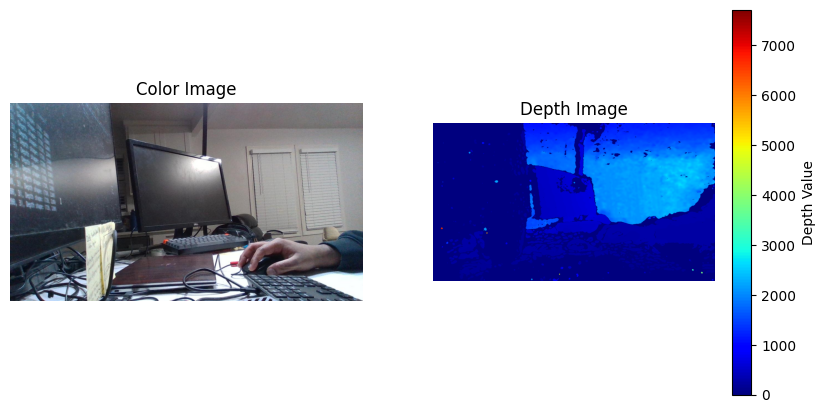

In [24]:
import psycopg2
import numpy as np
import io
import base64
from PIL import Image
import matplotlib.pyplot as plt

# Database connection settings
DATABASE_CONFIG = {
    "dbname": "postgres",  # Your database name
    "user": "postgres",  # Your PostgreSQL user
    "password": "1012",  # Your PostgreSQL password
    "host": "localhost",  # If running locally
    "port": "5432"  # Default PostgreSQL port
}

def retrieve_latest_frame():
    """Retrieve the latest frame (color + depth) from TimescaleDB"""
    conn = psycopg2.connect(**DATABASE_CONFIG)
    cursor = conn.cursor()

    # Fetch the most recent frame
    cursor.execute("SELECT color_image_base64, depth_image FROM frames ORDER BY timestamp DESC LIMIT 1;")
    result = cursor.fetchone()
    conn.close()

    if result:
        color_image_base64, depth_image_blob = result

        # Decode Base64 color image
        color_image = Image.open(io.BytesIO(base64.b64decode(color_image_base64)))
        color_image = np.array(color_image)

        # Decode depth image (BLOB)
        depth_image = np.load(io.BytesIO(depth_image_blob))

        return color_image, depth_image
    else:
        print("⚠️ No data found in the database.")
        return None, None

# Retrieve and display images
retrieved_color, retrieved_depth = retrieve_latest_frame()

if retrieved_color is not None and retrieved_depth is not None:
    plt.figure(figsize=(10, 5))

    # Display Color Image
    plt.subplot(1, 2, 1)
    plt.imshow(retrieved_color)
    plt.axis('off')
    plt.title("Color Image")

    # Display Depth Image
    plt.subplot(1, 2, 2)
    plt.imshow(retrieved_depth, cmap="jet")
    plt.colorbar(label="Depth Value")
    plt.axis('off')
    plt.title("Depth Image")

    plt.show()
